In [1]:
import pertpy as pt
import scanpy as sc
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
import seaborn as sns
from scipy import stats
from scipy import sparse 
from statsmodels.sandbox.stats.multicomp import multipletests


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [2]:
%load_ext autoreload
%autoreload 2

import importlib
importlib.reload(pt)

<module 'pertpy' from '/Users/tessa/miniforge3/envs/pertpy5/lib/python3.9/site-packages/pertpy/__init__.py'>

In [3]:
def test_association(adata, celltype_label = "Cluster", sample_label="Sample", condition_label = "Efficacy", conditions_compare = ("PR","SD")): 
    pvals = pd.DataFrame(1, adata.obs[celltype_label].unique().tolist(), ["mcp_"+str(n) for n in range(0,10)])
    tstats = pd.DataFrame(1, adata.obs[celltype_label].unique().tolist(), ["mcp_"+str(n) for n in range(0,10)])
    response = adata.obs.groupby(sample_label)[condition_label].agg(pd.Series.mode)
    res = dict()
    for celltype in adata.obs[celltype_label].unique().tolist():
        df = adata.obs[adata.obs[celltype_label]==celltype]

        for mcpnum in ["mcp_"+str(n) for n in range(0,10)]:
            mns = df.groupby(sample_label)[mcpnum].mean()
            mns = pd.concat([mns,response],axis=1)
            res = stats.ttest_ind(mns[mns[condition_label]==conditions_compare[0]][mcpnum],mns[mns[condition_label]==conditions_compare[1]][mcpnum])
            pvals.loc[celltype, mcpnum]=res[1]
            tstats.loc[celltype, mcpnum]=res[0]
    return pvals,tstats

In [4]:
def plot_split_violins(adata, mcp = "mcp_0", split="Efficacy", celltype_key = "Cluster"):
    df = sc.get.obs_df(adata, [celltype_key,mcp, split])
  

    p2 = sns.violinplot(data=df, x=celltype_key,y=mcp,hue=split, split=True)
    p2.set_xticklabels(p2.get_xticklabels(), rotation=45)


In [5]:
def mcp_pairsplot(adata, celltype_key = "Cluster", color = "Efficacy", mcp = "mcp_0", sample_key = "Sample"):
    mean_mcps = adata.obs.groupby([sample_key,celltype_key])[mcp].mean()
    mean_mcps = mean_mcps.reset_index()
    mcp_pivot = pd.pivot(mean_mcps[[sample_key,celltype_key,mcp]],index=sample_key,columns = celltype_key )[mcp]
    mcp_pivot = pd.concat([mcp_pivot,adata.obs.groupby([sample_key]).agg(pd.Series.mode)[color]],axis=1)
    sns.pairplot(mcp_pivot, corner=True, hue=color)
    

In [6]:
adata = sc.read_h5ad("zhang_with_PCs.h5ad")

In [7]:
# tumor samples only
adata = adata[adata.obs['Origin']=="t" ,:].copy()

In [8]:
# pre-treatment samples only 
adata = adata[adata.obs['Sample'].str.contains('Pre'),:].copy()

In [9]:
# isecs = adata.obs.groupby(["Cluster", "Sample"]).size()
isecs = pd.crosstab(adata.obs['Cluster'], adata.obs['Sample'])

(array([ 5.,  8.,  6.,  1.,  8.,  3., 10.,  4.,  7.,  5.]),
 array([ 0. ,  1.5,  3. ,  4.5,  6. ,  7.5,  9. , 10.5, 12. , 13.5, 15. ]),
 <BarContainer object of 10 artists>)

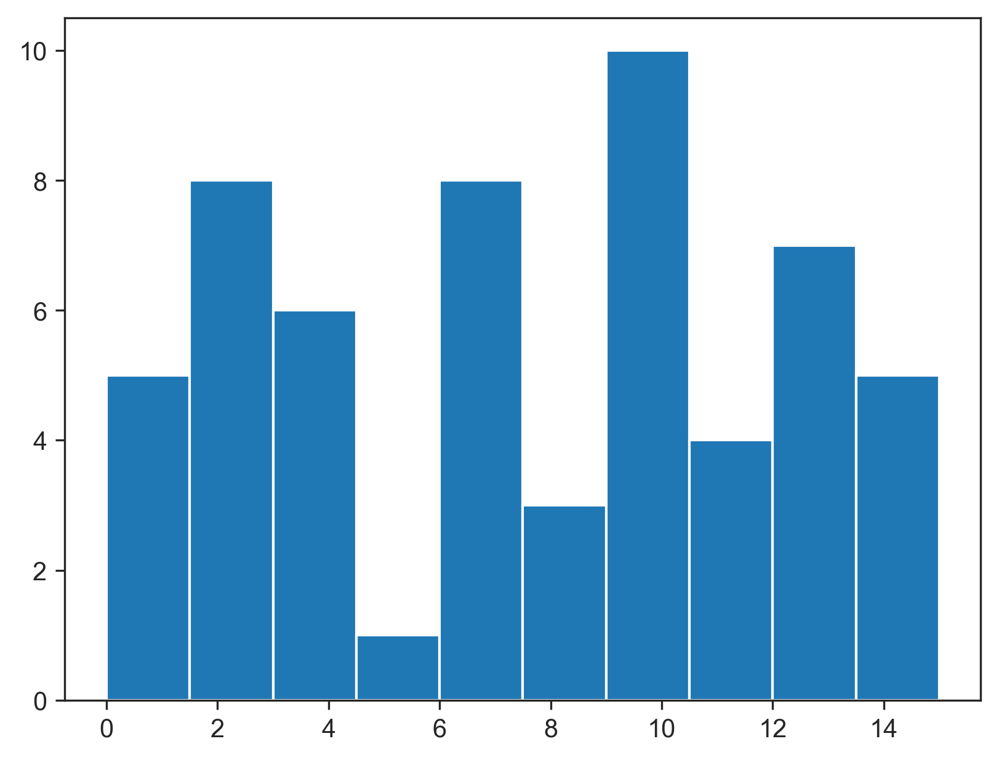

In [10]:
plt.hist((isecs >3).sum(axis=1))

In [11]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]]

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_pB-IGHG1,679,8,12,12,4,301,4,136,14,238,1753,911,1083,206,283


In [12]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]-1]

# drop sample Pre_P010_t 

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_CD4_Tcm-LMNA,4,392,569,249,0,288,6,311,20,134,555,77,593,444,87
t_CD4_Treg-FOXP3,13,338,110,62,0,464,24,419,17,518,769,743,398,122,130
t_CD8_Tem-GZMK,8,957,368,72,0,417,17,176,21,154,2354,202,709,891,292
t_Tn-LEF1,11,98,110,3494,0,1269,22,50,609,167,4010,175,1501,388,271


In [13]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]-2]
# drop Pre_P013_t, Pre_P017_t, Pre_P002_2

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_Bmem-CD27,377,11,12,105,0,1950,0,11,166,22,4210,132,309,121,400
t_CD8_MAIT-KLRB1,0,51,1244,45,0,40,7,84,24,19,67,14,38,20,11
t_CD8_Trm-ZNF683,3,76,180,71,0,143,4,407,4,226,422,121,449,219,150
t_mono-FCN1,4,60,11,12,0,14,23,44,1,31,43,15,51,33,16


In [14]:
celltypes = isecs[(isecs > 3).sum(axis=1) >= np.shape(isecs)[1]-2].index.values.to_list()

In [15]:
# subset to cell types with sufficient expression
adata = adata[adata.obs['Cluster'].isin(celltypes),:].copy()

In [16]:
adata

AnnData object with n_obs × n_vars = 44636 × 4000
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [17]:
isecs = pd.crosstab(adata.obs['Cluster'], adata.obs['Sample'])

In [18]:
keep_pts = isecs.loc[:,(isecs > 3).sum(axis=0) == isecs.shape[0]].columns.values.to_list()

In [19]:
adata = adata[adata.obs['Sample'].isin(keep_pts),:].copy()

In [20]:
pd.crosstab(adata.obs['Cluster'], adata.obs['Sample']).min(axis=1)

Cluster
t_Bmem-CD27         11
t_CD4_Tcm-LMNA      77
t_CD4_Treg-FOXP3    62
t_CD8_MAIT-KLRB1    11
t_CD8_Tem-GZMK      72
t_CD8_Trm-ZNF683    71
t_Tn-LEF1           50
t_mono-FCN1         11
t_pB-IGHG1           8
dtype: int64

In [21]:
pd.crosstab(adata.obs['Cluster'], adata.obs['Sample']).min(axis=0)

Sample
Pre_P004_t     8
Pre_P005_t    11
Pre_P007_t    12
Pre_P012_t    14
Pre_P016_t    11
Pre_P018_t    19
Pre_P019_t    43
Pre_P020_t    14
Pre_P022_t    38
Pre_P023_t    20
Pre_P025_t    11
dtype: int64

In [22]:
# cell counts look passable (though definitely low for some -- could consider dropping more things)

In [23]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [24]:
adata.obs.columns
adata_plot = sc.pp.subsample(adata,  n_obs=10000, random_state=0, copy=True)

In [ ]:
sc.pl.umap(
    adata_plot,
    color=[
        "Sample"
    ],
)

# definitely sample splitting -- unclear if batch effect vs interpatient variation

In [ ]:
sc.pl.umap(
    adata_plot,
    color=[
        "Treatment"
    ],
)

In [ ]:
sc.pl.umap(
    adata_plot,
    color=[
        "Cluster"
    ],
)

In [ ]:
sc.pl.umap(
    adata_plot,
    color=[
        "Efficacy"
    ],
)

In [30]:
#dl = pt.tl.Dialogue(sample_id = "Sample",
#                   celltype_key = "Cluster",
#                   n_counts_key = "Number of counts",
#                   n_mpcs = 10)

In [31]:
#adata_stash = adata.copy()


In [32]:
adata_1 = adata.copy()

dl_1 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_1, mcps_1, ws_1, ct_subs_1 = dl_1.calculate_multifactor_PMD(
    adata_1,
    normalize=False,
    solver="lp"
)

#adata, mcps, ws, ct_subs = dl.calculate_multifactor_PMD(
#    adata,
#    groupby='Sample',
#    celltype_key='Cluster',
#    mimic_dialogue=True,
#    n_components=10
#)

pvals_1, tstats_1 = test_association(adata_1)

In [33]:
pvals_1.min()

mcp_0    0.483565
mcp_1    0.390582
mcp_2    0.154033
mcp_3    0.060374
mcp_4    0.125419
mcp_5    0.066498
mcp_6    0.126202
mcp_7    0.076489
mcp_8    0.134388
mcp_9    0.091351
dtype: float64

In [34]:
adata_2 = adata.copy()

dl_2 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_2, mcps_2, ws_2, ct_subs_2 = dl_2.calculate_multifactor_PMD(
    adata_2,
    normalize=True,
    solver="lp"
)

pvals_2, tstats_2 = test_association(adata_2)

In [40]:
import pickle as pkl

dlg_dict = {"mcps":mcps_2, "ws":ws_2,"ct_subs_2":ct_subs_2, "pvals":pvals_2, "tstats":tstats_2}
outfile =  "preliminary_results_normalizeTrue_lpsolver_031523.pkl"
with open(outfile, 'wb') as pickle_file:
    pkl.dump(dlg_dict, pickle_file)


In [41]:
pickle_file.close()


In [42]:
adata_2.write("preliminary_results_normalizeTrue_lpsolver_031523.h5ad")

In [43]:
pvals_2.min()

mcp_0    0.148392
mcp_1    0.142909
mcp_2    0.138914
mcp_3    0.135653
mcp_4    0.133086
mcp_5    0.130999
mcp_6    0.099959
mcp_7    0.050454
mcp_8    0.033683
mcp_9    0.028501
dtype: float64

In [44]:
adata_3 = adata.copy()

dl_3 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_3, mcps_3, ws_3, ct_subs_3 = dl_3.calculate_multifactor_PMD(
    adata_3,
    normalize=False,
    solver="bs"
)
pvals_3, tstats_3 = test_association(adata_3)

In [45]:
pvals_3.min()

mcp_0    0.483617
mcp_1    0.013421
mcp_2    0.350504
mcp_3    0.111273
mcp_4    0.112388
mcp_5    0.012044
mcp_6    0.110091
mcp_7    0.145990
mcp_8    0.092108
mcp_9    0.008754
dtype: float64

In [198]:
# need to implement automated chi-squared testing of efficacy w MCPs
# 
# also something for multiple testing correction

# and then need plotting utilities 
#  I'd like to get the pairs plots but need to decide which cells count as in MCP 

# also -- MCP membership -- how does that work here? 
# want to choose ones with decent correlations

In [46]:
adata_4 = adata.copy()

dl_4 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_4, mcps_4, ws_4, ct_subs_4 = dl_4.calculate_multifactor_PMD(
    adata_4,
    normalize=True,
    solver="bs"
)

In [47]:
pvals_4, tstats_4 = test_association(adata_4)

In [48]:
pvals_4.min()

mcp_0    0.088695
mcp_1    0.284868
mcp_2    0.149251
mcp_3    0.500112
mcp_4    0.007831
mcp_5    0.194837
mcp_6    0.311618
mcp_7    0.120504
mcp_8    0.006403
mcp_9    0.122496
dtype: float64

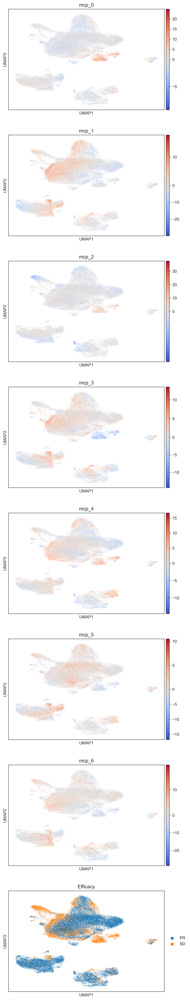

In [49]:
sc.pl.umap(adata_4, color=["mcp_0", "mcp_1", "mcp_2","mcp_3","mcp_4","mcp_5","mcp_6","Efficacy"], ncols=1, cmap='coolwarm', vcenter=0)


In [278]:
adata_5 = adata.copy()

dl_5 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_5, mcps_5, ws_5, ct_subs_5 = dl.calculate_multifactor_PMD(
    adata_5,
    normalize=True,
    solver="bs",
    ct_order = ['t_mono-FCN1','t_Bmem-CD27','t_CD8_Tem-GZMK','t_CD4_Treg-FOXP3',
 't_CD4_Tcm-LMNA',
 't_CD8_MAIT-KLRB1',
 't_CD8_Trm-ZNF683',
 't_Tn-LEF1',
 't_pB-IGHG1']
)

In [209]:
pvals_5, tstats_5 = test_association(adata_5)

In [211]:
pvals_5.min() - pvals_4.min() # ok so this is definitely the order dependent one
# which means I really want to be using the lp option ugh 

mcp_0   -0.000022
mcp_1   -0.002650
mcp_2   -0.137412
mcp_3   -0.332146
mcp_4    0.503261
mcp_5    0.057915
mcp_6   -0.008549
mcp_7   -0.031994
mcp_8   -0.002816
mcp_9   -0.075867
dtype: float64

In [282]:
adata_6 = adata.copy()
#adata_6.X = np.array(adata.X).copy()
adata_6.X = sparse.csr_matrix(adata_6.X)
dl_6 = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_6, mcps_6, ws_6, ct_subs_6 = dl.calculate_multifactor_PMD(
    adata_6,
    normalize=True,
    solver="lp",
    agg_pca=False
)

pvals_6, tstats_6 = test_association(adata_6)

AttributeError: median not found

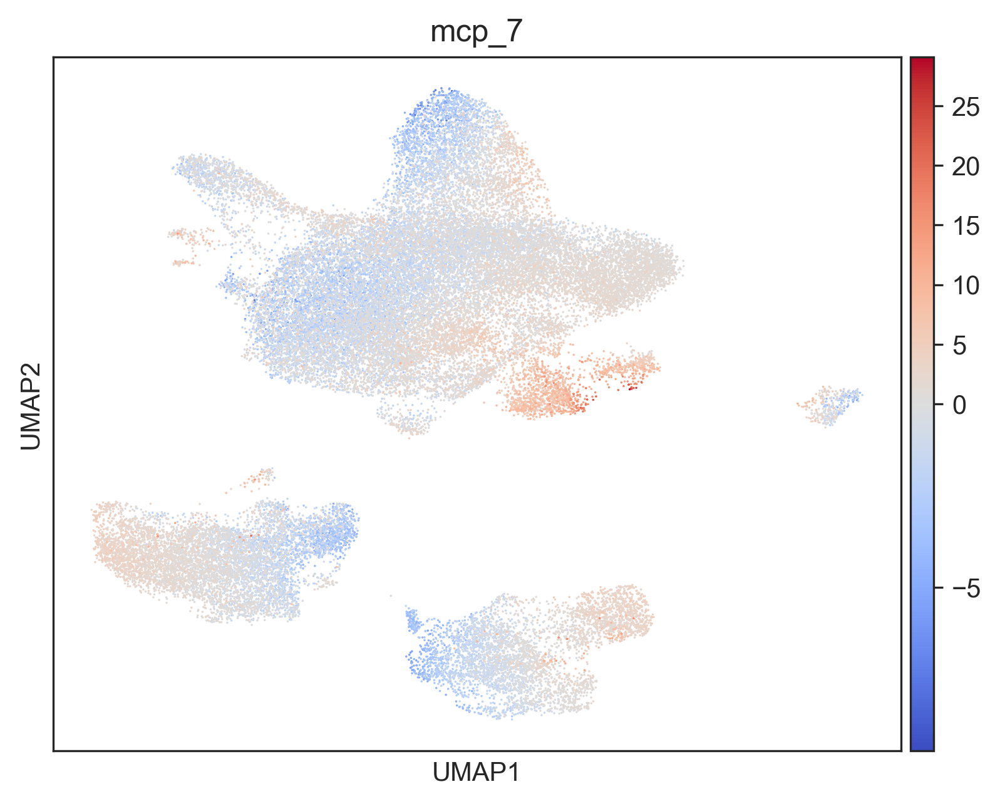

In [229]:
sc.pl.umap(adata_2, color="mcp_7", ncols=1, cmap='coolwarm', vcenter=0)


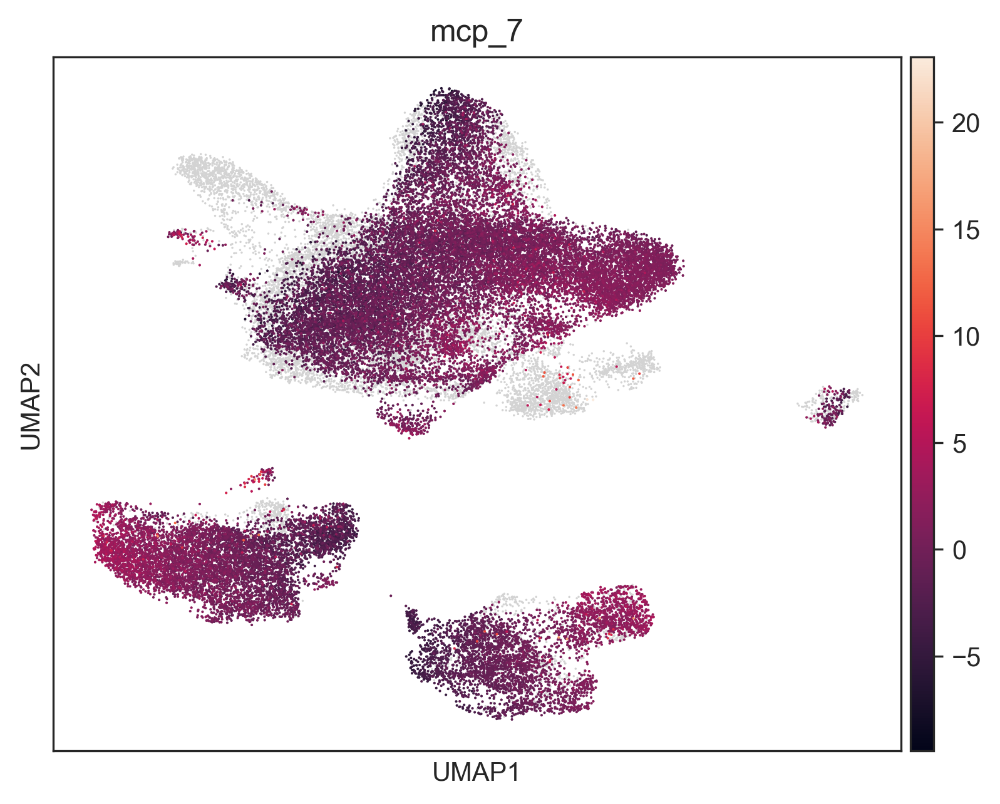

In [230]:
ax = plt.subplot()
sc.pl.umap(adata_2, ax=ax, show=False)
sc.pl.umap(adata_2[adata_2.obs["Efficacy"].isin(["PR"])], color="mcp_7", ax=ax, show=False)
plt.show()

In [218]:
adata_2.obs['Efficacy'].value_counts()

PR    30712
SD    11838
Name: Efficacy, dtype: int64

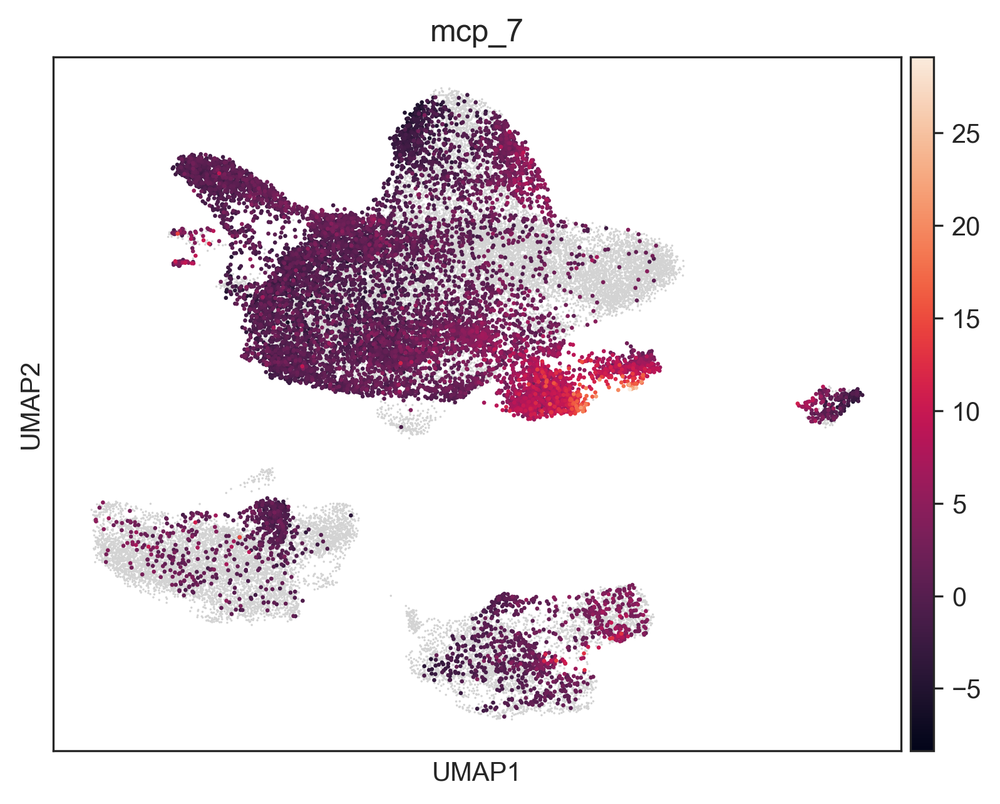

In [231]:
ax = plt.subplot()
sc.pl.umap(adata_2, ax=ax, show=False)
sc.pl.umap(adata_2[adata_2.obs["Efficacy"].isin(["SD"])], color="mcp_7", ax=ax, show=False)
plt.show()

In [234]:
ax = plt.subplot()
sc.pl.umap(adata_2, ax=ax, show=False)
sc.pl.umap(adata_2[adata_2.obs["Efficacy"].isin(["PR"])], color="mcp_8", ax=ax, show=False)
plt.show()

In [227]:
#res = stats.ttest_ind(mns[mns['Efficacy']=='PR']['1'],mns[mns['Efficacy']=='SD']['1'])

In [176]:
p_adjusted = multipletests(pvals.transpose()['t_CD4_Treg-FOXP3'], method='bonferroni')

In [178]:
# I'm not sure what makes sense a multiple testing correction here
# treating the MCPs as independent and doing bonferroni on a given cell type indicates no significant correlations

In [179]:
multipletests(pvals.transpose()['t_Bmem-CD27'], method='bonferroni')

(array([False, False, False, False, False, False, False, False, False,
        False]),
 array([1.        , 1.        , 1.        , 1.        , 0.08144188,
        1.        , 1.        , 1.        , 0.07457995, 1.        ]),
 0.005116196891823743,
 0.005)

In [181]:
multipletests(pvals.transpose()['t_Tn-LEF1'], method='bonferroni')

(array([False, False, False, False, False, False, False, False, False,
        False]),
 array([1.        , 1.        , 1.        , 1.        , 0.06156236,
        1.        , 1.        , 1.        , 0.30611572, 1.        ]),
 0.005116196891823743,
 0.005)

In [185]:
multipletests(pvals['4'], method='bonferroni')

(array([False, False, False, False, False, False, False, False, False]),
 array([0.07329769, 0.05015518, 0.21242086, 0.087883  , 0.18137732,
        0.15099661, 0.05540613, 0.57795322, 0.07848545]),
 0.005683044988048058,
 0.005555555555555556)

In [186]:
multipletests(pvals['8'], method='bonferroni')

(array([False, False, False, False, False, False, False, False, False]),
 array([0.06712195, 0.09490321, 1.        , 1.        , 0.51654228,
        0.1307671 , 0.27550415, 1.        , 0.39863003]),
 0.005683044988048058,
 0.005555555555555556)

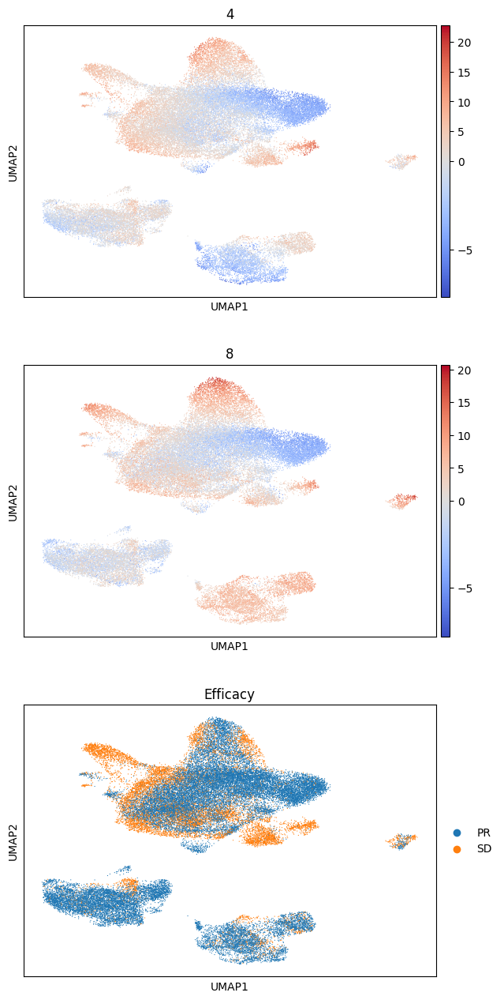

In [187]:
sc.pl.umap(adata, color=['4','8',"Efficacy"], ncols=1, cmap='coolwarm', vcenter=0)


[Text(0, 0, 't_Bmem-CD27'),
 Text(1, 0, 't_CD4_Tcm-LMNA'),
 Text(2, 0, 't_CD4_Treg-FOXP3'),
 Text(3, 0, 't_CD8_MAIT-KLRB1'),
 Text(4, 0, 't_CD8_Tem-GZMK'),
 Text(5, 0, 't_CD8_Trm-ZNF683'),
 Text(6, 0, 't_Tn-LEF1'),
 Text(7, 0, 't_mono-FCN1'),
 Text(8, 0, 't_pB-IGHG1')]

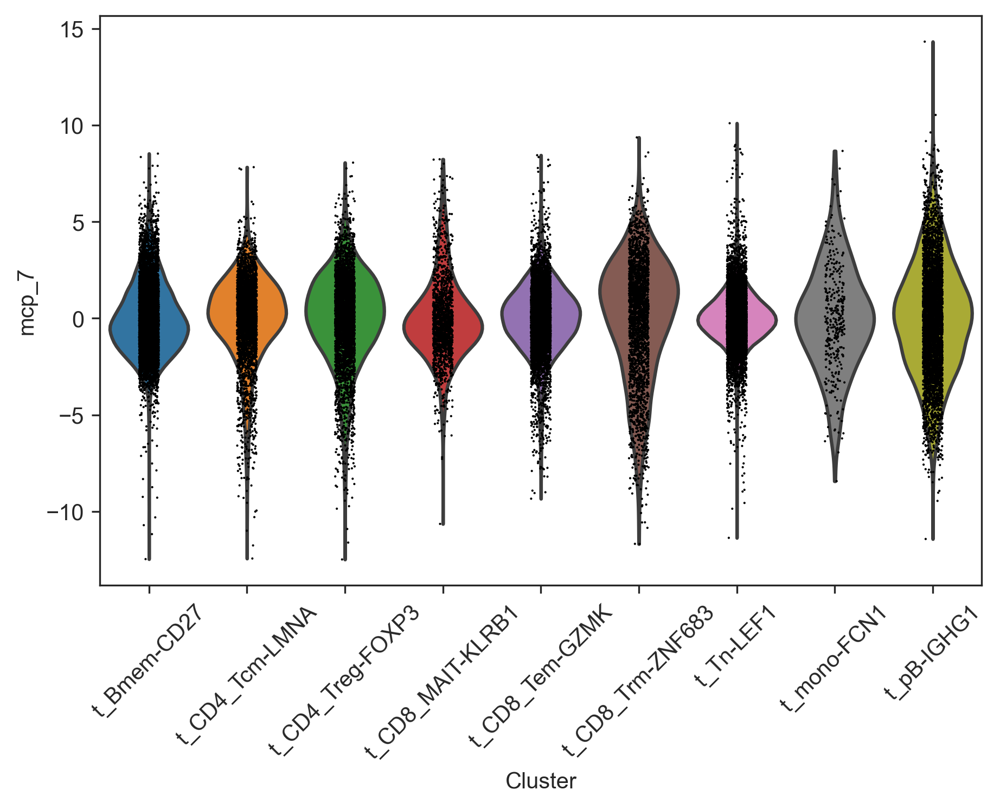

In [241]:
p = sc.pl.violin(adata_1, 'mcp_7', groupby= "Cluster", show=False)
p.set_xticklabels(p.get_xticklabels(), rotation=45)



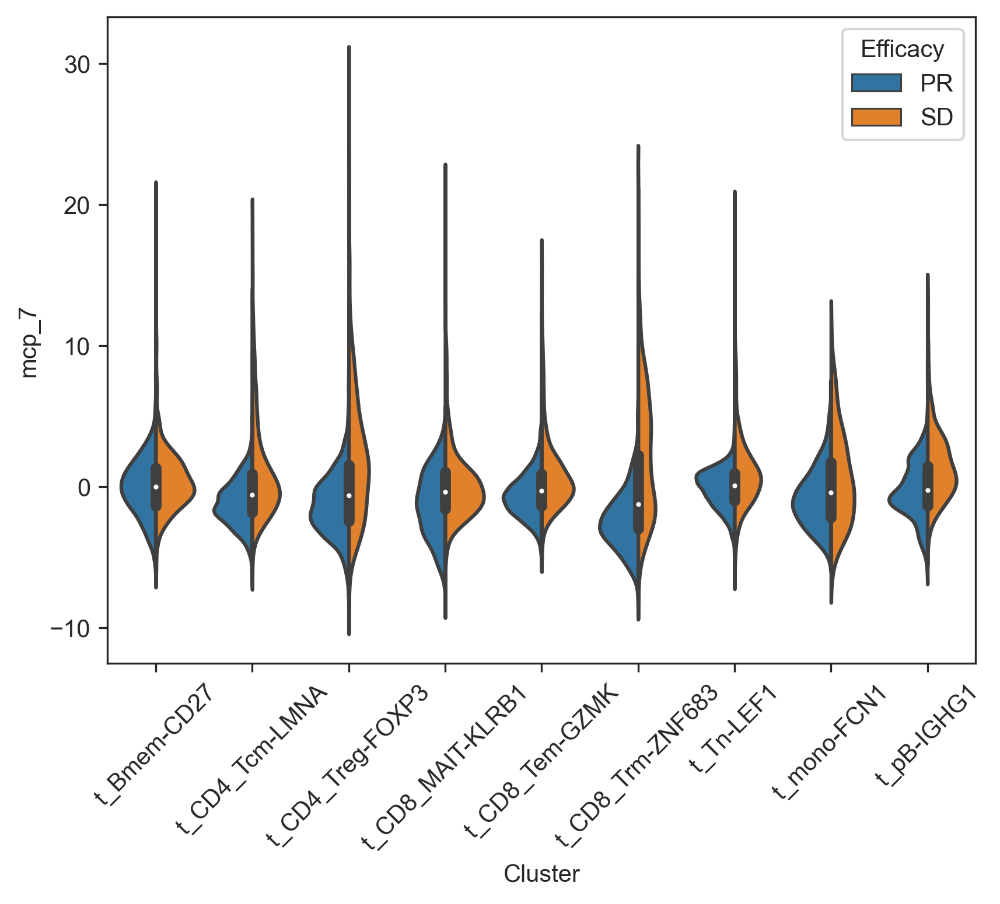

In [248]:
plot_split_violins(adata_2,mcp="mcp_7", split="Efficacy")

[Text(0, 0, 'Pre_P004_t'),
 Text(1, 0, 'Pre_P005_t'),
 Text(2, 0, 'Pre_P007_t'),
 Text(3, 0, 'Pre_P012_t'),
 Text(4, 0, 'Pre_P016_t'),
 Text(5, 0, 'Pre_P018_t'),
 Text(6, 0, 'Pre_P019_t'),
 Text(7, 0, 'Pre_P020_t'),
 Text(8, 0, 'Pre_P022_t'),
 Text(9, 0, 'Pre_P023_t'),
 Text(10, 0, 'Pre_P025_t')]

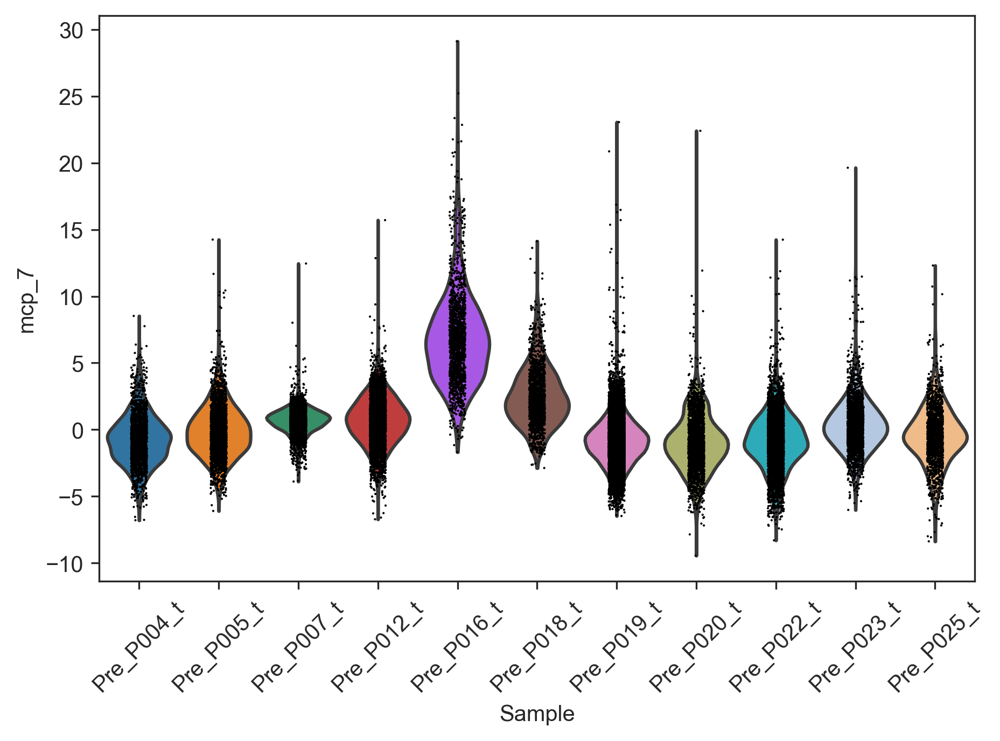

In [253]:
p = sc.pl.violin(adata_2, 'mcp_7', groupby= "Sample", show=False)
p.set_xticklabels(p.get_xticklabels(), rotation=45)

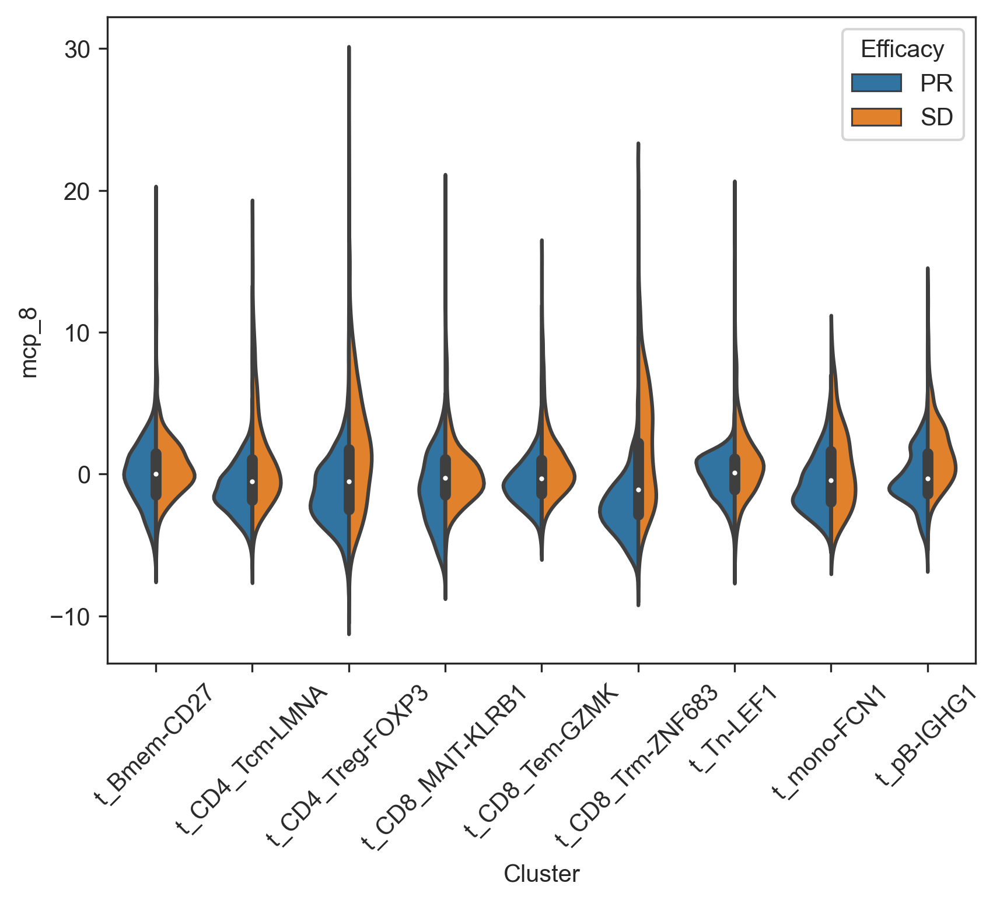

In [249]:
plot_split_violins(adata_2,mcp="mcp_8", split="Efficacy")

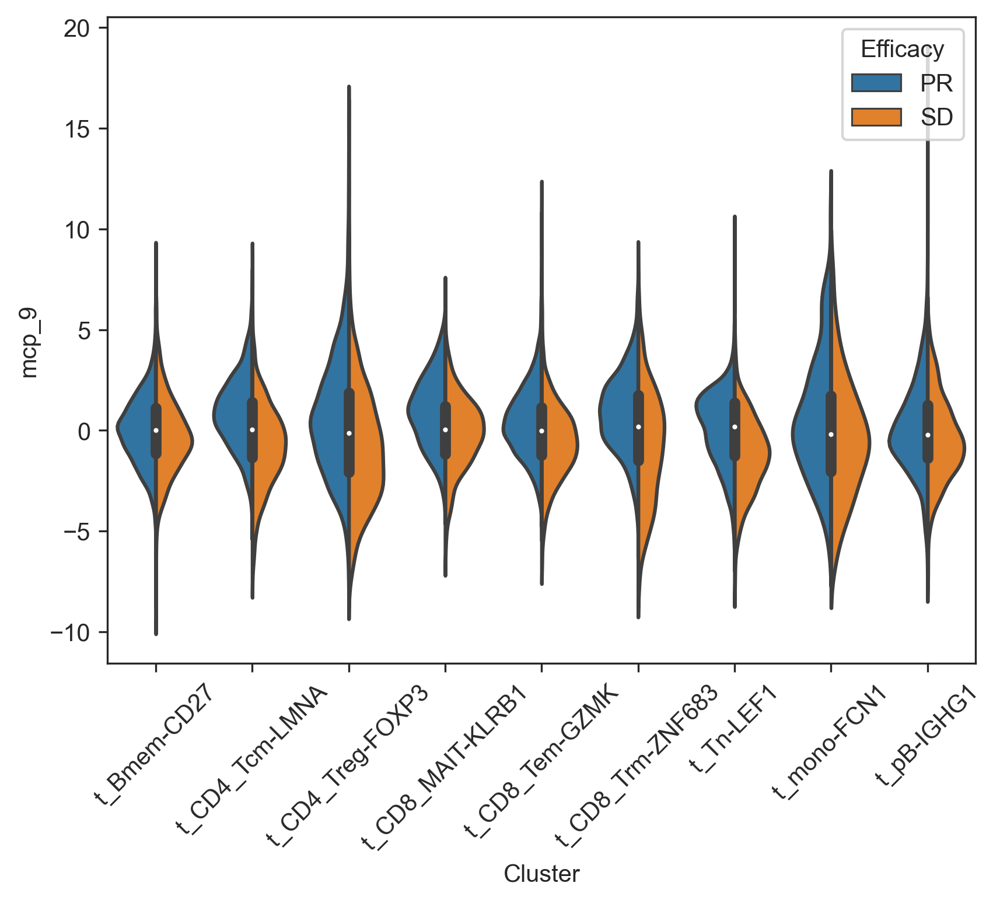

In [251]:
plot_split_violins(adata_2,mcp="mcp_9", split="Efficacy")

[Text(0, 0, 't_Bmem-CD27'),
 Text(1, 0, 't_CD4_Tcm-LMNA'),
 Text(2, 0, 't_CD4_Treg-FOXP3'),
 Text(3, 0, 't_CD8_MAIT-KLRB1'),
 Text(4, 0, 't_CD8_Tem-GZMK'),
 Text(5, 0, 't_CD8_Trm-ZNF683'),
 Text(6, 0, 't_Tn-LEF1'),
 Text(7, 0, 't_mono-FCN1'),
 Text(8, 0, 't_pB-IGHG1')]

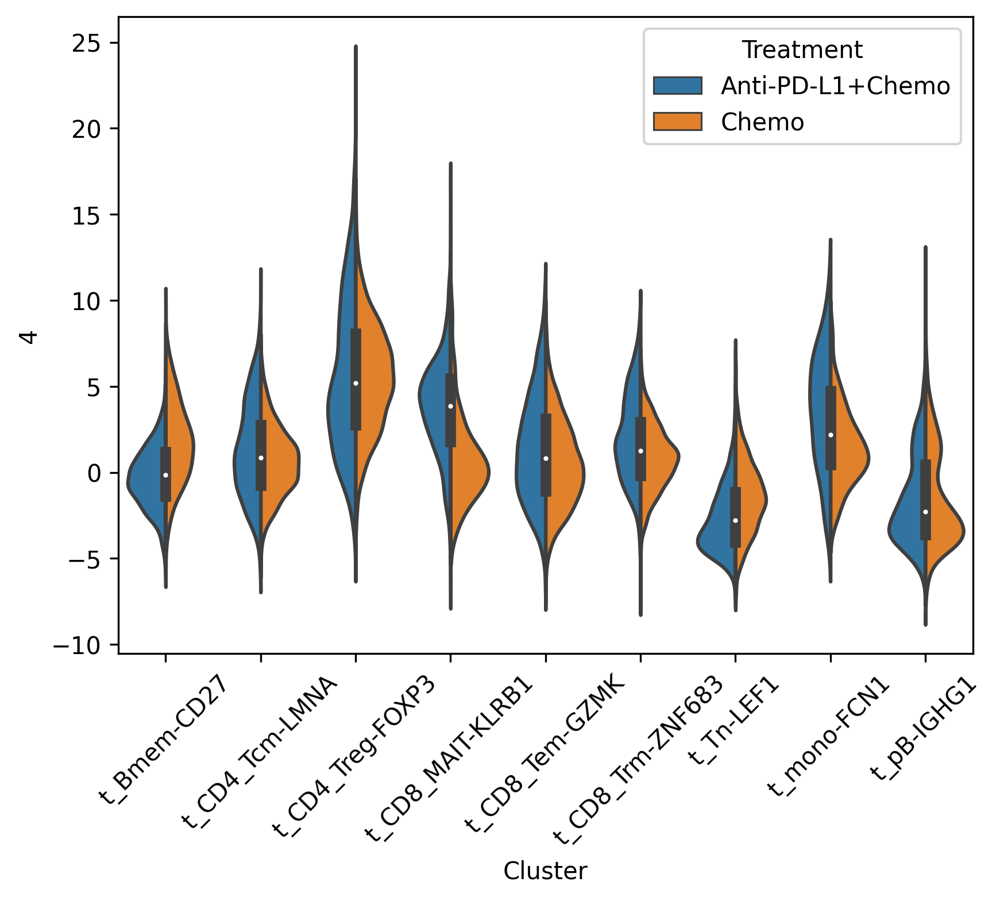

In [256]:
df = sc.get.obs_df(adata, ['Cluster','4', 'Treatment'])
#df = df.set_index('Efficacy').stack().reset_index()
#df.columns = []
#df.columns = ['Efficacy', 'MCP', 'value']
#import seaborn as sns
#sns.violinplot(data=df, x='gene', y='value', hue="louvain",
#                split=True, inner="quart", linewidth=1)    

p2 = sns.violinplot(data=df, x="Cluster",y="4",hue="Treatment", split=True)
p2.set_xticklabels(p2.get_xticklabels(), rotation=45)


# suggestion: separate out chemo response from other response 

In [254]:
adata

AnnData object with n_obs × n_vars = 42550 × 4000
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9'
    uns: 'Efficacy_colors', 'Cluster_colors'
    obsm: 'X_pca', 'X_umap'

In [258]:
adata.obs

,Sample,Patient,Origin,Tissue,Efficacy,Group,Treatment,Number of counts,Number of genes,Major celltype,...,0,1,2,3,4,5,6,7,8,9
Cell barcode,,,,,,,,,,,,,,,,,,,,,
AAATGCCTCATCTGCC.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,068",513,B cell,...,0.024630,1.731156,-0.744848,-1.153238,-2.364669,-0.565459,0.213890,-2.235570,-1.612739,1.157751
AATCCAGAGCGTTCCG.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,309",545,B cell,...,-0.015568,2.379186,0.599248,-0.514839,-0.284651,-2.689229,1.609176,-2.426111,-0.577653,-0.304269
ACAGCCGAGCACCGCT.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,344",499,B cell,...,-0.587769,8.887239,-7.857848,1.351051,-0.978295,1.568127,7.358125,1.636297,0.596706,2.042717
ACCGTAAAGCTAACTC.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,992,560,B cell,...,-0.932235,1.265569,1.186969,4.360674,1.087998,-3.106793,4.730175,-1.088912,0.503664,-3.890688
ACGAGCCTCGTAGGTT.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,482",715,B cell,...,1.184637,1.318599,-1.971468,-1.286478,-1.083146,-0.509761,-0.303302,-3.145903,-0.818008,2.993912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CGGGTCAGTTCCCGAG.Pre_P004_t,Pre_P004_t,P004,t,chest_wall,SD,Pre-treatment,Anti-PD-L1+Chemo,"1,530",455,B cell,...,0.587343,8.492218,-4.851919,0.032954,8.585988,-4.671846,6.195424,0.022150,13.920639,-0.366522
GCTTGAACAGGCTGAA.Pre_P004_t,Pre_P004_t,P004,t,chest_wall,SD,Pre-treatment,Anti-PD-L1+Chemo,"15,601","1,716",B cell,...,0.142078,3.853591,-3.314564,-1.735825,1.445790,0.577677,-7.093648,-3.069069,9.240065,-1.230335
GTCGGGTGTCCGAATT.Pre_P004_t,Pre_P004_t,P004,t,chest_wall,SD,Pre-treatment,Anti-PD-L1+Chemo,"23,259","1,702",B cell,...,-0.874502,9.149309,-4.820769,1.425461,5.622560,0.482708,-1.389746,-0.723072,11.438540,-3.962799


In [262]:
adata.obs.groupby('Sample')['4'].mean()

Sample
Pre_P004_t    5.270521
Pre_P005_t    3.123903
Pre_P007_t   -3.217801
Pre_P012_t   -1.170567
Pre_P016_t    5.479860
Pre_P018_t    2.021408
Pre_P019_t   -0.606908
Pre_P020_t    0.896981
Pre_P022_t   -0.298503
Pre_P023_t    0.002636
Pre_P025_t    2.540024
Name: 4, dtype: float64

In [323]:
mean_mcps = adata.obs.groupby(['Sample','Cluster'])[[str(i) for i in range(0,10)]].mean()

In [324]:
mean_mcps['Efficacy']= adata.obs.groupby(['Sample','Cluster'])['Efficacy'].agg(pd.Series.mode)


In [325]:
mean_mcps['Treatment']=adata.obs.groupby(['Sample','Cluster'])['Treatment'].agg(pd.Series.mode)


mean_mcps

In [326]:
mean_mcps

0          1         2          3  \
Sample     Cluster                                                      
Pre_P004_t t_Bmem-CD27       0.681582   7.384475 -2.214836   0.381741   
           t_CD4_Tcm-LMNA   -0.419566   7.355825 -2.403693   0.061003   
           t_CD4_Treg-FOXP3 -0.143306   7.703682 -3.618304  -0.933352   
           t_CD8_MAIT-KLRB1 -0.773995   5.947383 -2.359044  -1.630408   
           t_CD8_Tem-GZMK   -1.082588   7.152841 -1.067013  -0.695885   
...                               ...        ...       ...        ...   
Pre_P025_t t_CD8_Tem-GZMK   -1.197396  11.522308  0.681213   3.078151   
           t_CD8_Trm-ZNF683 -1.146200  12.716036 -0.396044   4.882919   
           t_Tn-LEF1        -0.341718   8.006705  0.064817   3.336528   
           t_mono-FCN1      -3.028514  18.755076  0.481233  11.217707   
           t_pB-IGHG1       -0.212590   8.120909 -1.207545   2.988902   

                                    4         5         6          7  \
Sample     Cluster                                                     
Pre_P004_t t_Bmem-CD27       2.821699  0.587577  3.087229  -0.344274   
           t_CD4_Tcm-LMNA    4.074874  0.626491  2.901234   0.708336   
           t_CD4_Treg-FOXP3  9.092879  0.117198  2.825577  -1.402054   
           t_CD8_MAIT-KLRB1  3.987962 -1.268520  3.255535  -0.003192   
           t_CD8_Tem-GZMK    4.793798  0.119723  2.217708  -0.203729   
...                               ...       ...       ...        ...   
Pre_P025_t t_CD8_Tem-GZMK    2.625476  2.197002  2.771970   5.210516   
           t_CD8_Trm-ZNF683  1.950819  2.898844  1.707148   4.404909   
           t_Tn-LEF1         0.591289  2.048829  0.221910   6.991064   
           t_mono-FCN1       4.015364  7.417645  8.640546  10.025541   
           t_pB-IGHG1        1.559776 -0.409842 -0.901339   0.321430   

                                     8         9 Efficacy         Treatment  
Sample     Cluster                                                           
Pre_P004_t t_Bmem-CD27        2.380794  0.821484       SD  Anti-PD-L1+Chemo  
           t_CD4_Tcm-LMNA     2.927949  0.575786       SD  Anti-PD-L1+Chemo  
           t_CD4_Treg-FOXP3   8.571626  2.129996       SD  Anti-PD-L1+Chemo  
           t_CD8_MAIT-KLRB1   3.821417  2.039023       SD  Anti-PD-L1+Chemo  
           t_CD8_Tem-GZMK     4.259895  1.532937       SD  Anti-PD-L1+Chemo  
...                                ...       ...      ...               ...  
Pre_P025_t t_CD8_Tem-GZMK     1.708266  1.698675       SD             Chemo  
           t_CD8_Trm-ZNF683   2.212474  0.163236       SD             Chemo  
           t_Tn-LEF1         -0.833369  1.707644       SD             Chemo  
           t_mono-FCN1       11.375843 -5.444514       SD             Chemo  
           t_pB-IGHG1         7.178976 -1.557887       SD             Chemo  

[99 rows x 12 columns]

In [327]:
mean_mcps['0'].to_frame().reset_index()

,Sample,Cluster,0
0,Pre_P004_t,t_Bmem-CD27,0.681582
1,Pre_P004_t,t_CD4_Tcm-LMNA,-0.419566
2,Pre_P004_t,t_CD4_Treg-FOXP3,-0.143306
3,Pre_P004_t,t_CD8_MAIT-KLRB1,-0.773995
4,Pre_P004_t,t_CD8_Tem-GZMK,-1.082588
...,...,...,...
94,Pre_P025_t,t_CD8_Tem-GZMK,-1.197396
95,Pre_P025_t,t_CD8_Trm-ZNF683,-1.146200
96,Pre_P025_t,t_Tn-LEF1,-0.341718
97,Pre_P025_t,t_mono-FCN1,-3.028514


In [328]:
mean_mcps = mean_mcps.reset_index()

In [329]:
#mean_mcps = mean_mcps.set_index('Sample')

In [376]:
mean_mcps

,Sample,Cluster,0,1,2,3,4,5,6,7,8,9,Efficacy,Treatment
0,Pre_P004_t,t_Bmem-CD27,0.681582,7.384475,-2.214836,0.381741,2.821699,0.587577,3.087229,-0.344274,2.380794,0.821484,SD,Anti-PD-L1+Chemo
1,Pre_P004_t,t_CD4_Tcm-LMNA,-0.419566,7.355825,-2.403693,0.061003,4.074874,0.626491,2.901234,0.708336,2.927949,0.575786,SD,Anti-PD-L1+Chemo
2,Pre_P004_t,t_CD4_Treg-FOXP3,-0.143306,7.703682,-3.618304,-0.933352,9.092879,0.117198,2.825577,-1.402054,8.571626,2.129996,SD,Anti-PD-L1+Chemo
3,Pre_P004_t,t_CD8_MAIT-KLRB1,-0.773995,5.947383,-2.359044,-1.630408,3.987962,-1.268520,3.255535,-0.003192,3.821417,2.039023,SD,Anti-PD-L1+Chemo
4,Pre_P004_t,t_CD8_Tem-GZMK,-1.082588,7.152841,-1.067013,-0.695885,4.793798,0.119723,2.217708,-0.203729,4.259895,1.532937,SD,Anti-PD-L1+Chemo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,Pre_P025_t,t_CD8_Tem-GZMK,-1.197396,11.522308,0.681213,3.078151,2.625476,2.197002,2.771970,5.210516,1.708266,1.698675,SD,Chemo
95,Pre_P025_t,t_CD8_Trm-ZNF683,-1.146200,12.716036,-0.396044,4.882919,1.950819,2.898844,1.707148,4.404909,2.212474,0.163236,SD,Chemo
96,Pre_P025_t,t_Tn-LEF1,-0.341718,8.006705,0.064817,3.336528,0.591289,2.048829,0.221910,6.991064,-0.833369,1.707644,SD,Chemo
97,Pre_P025_t,t_mono-FCN1,-3.028514,18.755076,0.481233,11.217707,4.015364,7.417645,8.640546,10.025541,11.375843,-5.444514,SD,Chemo


In [443]:
mcp4 = pd.pivot(mean_mcps[['Sample','Cluster','4']],index="Sample",columns = "Cluster" )['4']

In [444]:
#mcp4 = mean_mcps[['Sample','Cluster','4','Efficacy','Treatment']]

In [445]:
mcp4

Cluster,t_Bmem-CD27,t_CD4_Tcm-LMNA,t_CD4_Treg-FOXP3,t_CD8_MAIT-KLRB1,t_CD8_Tem-GZMK,t_CD8_Trm-ZNF683,t_Tn-LEF1,t_mono-FCN1,t_pB-IGHG1
Sample,,,,,,,,,
Pre_P004_t,2.821699,4.074874,9.092879,3.987962,4.793798,4.762421,2.301447,6.654665,1.751082
Pre_P005_t,2.310590,1.985828,6.826035,4.240347,1.878354,2.019839,-1.149438,3.444968,1.862427
Pre_P007_t,-0.805416,-0.977795,2.138185,-0.207305,-0.177446,-0.060127,-3.732638,1.170402,-1.177890
Pre_P012_t,-0.816237,-1.226769,2.253885,-1.033496,-1.773407,-0.351232,-2.952402,-1.841547,-0.720151
Pre_P016_t,4.064823,3.621530,10.564403,5.545790,3.789841,4.437876,1.679402,4.005852,1.317764
Pre_P018_t,0.592880,0.958659,5.222837,0.537738,1.056456,0.601494,0.024006,0.564034,-0.533492
Pre_P019_t,-0.079404,-0.186017,3.302542,-0.416721,0.460394,0.607414,-2.119359,1.272080,-2.041158
Pre_P020_t,0.321408,-0.265365,5.381289,0.610172,0.204792,-0.230527,-1.597287,0.395616,-1.783679
Pre_P022_t,0.894882,0.679331,5.940815,0.207733,0.398890,0.684115,-1.886743,2.186607,-2.264833


In [254]:
sns.pairplot(mcp4, corner=True)

NameError: name 'mcp4' is not defined

In [456]:
mcp4 = pd.concat([mcp4,adata.obs.groupby(['Sample']).agg(pd.Series.mode)[['Efficacy','Treatment']]],axis=1)

In [457]:
mcp4

,t_Bmem-CD27,t_CD4_Tcm-LMNA,t_CD4_Treg-FOXP3,t_CD8_MAIT-KLRB1,t_CD8_Tem-GZMK,t_CD8_Trm-ZNF683,t_Tn-LEF1,t_mono-FCN1,t_pB-IGHG1,Efficacy,Treatment
Sample,,,,,,,,,,,
Pre_P004_t,2.821699,4.074874,9.092879,3.987962,4.793798,4.762421,2.301447,6.654665,1.751082,SD,Anti-PD-L1+Chemo
Pre_P005_t,2.310590,1.985828,6.826035,4.240347,1.878354,2.019839,-1.149438,3.444968,1.862427,SD,Anti-PD-L1+Chemo
Pre_P007_t,-0.805416,-0.977795,2.138185,-0.207305,-0.177446,-0.060127,-3.732638,1.170402,-1.177890,PR,Anti-PD-L1+Chemo
Pre_P012_t,-0.816237,-1.226769,2.253885,-1.033496,-1.773407,-0.351232,-2.952402,-1.841547,-0.720151,PR,Anti-PD-L1+Chemo
Pre_P016_t,4.064823,3.621530,10.564403,5.545790,3.789841,4.437876,1.679402,4.005852,1.317764,SD,Anti-PD-L1+Chemo
Pre_P018_t,0.592880,0.958659,5.222837,0.537738,1.056456,0.601494,0.024006,0.564034,-0.533492,SD,Chemo
Pre_P019_t,-0.079404,-0.186017,3.302542,-0.416721,0.460394,0.607414,-2.119359,1.272080,-2.041158,PR,Anti-PD-L1+Chemo
Pre_P020_t,0.321408,-0.265365,5.381289,0.610172,0.204792,-0.230527,-1.597287,0.395616,-1.783679,PR,Chemo
Pre_P022_t,0.894882,0.679331,5.940815,0.207733,0.398890,0.684115,-1.886743,2.186607,-2.264833,PR,Chemo


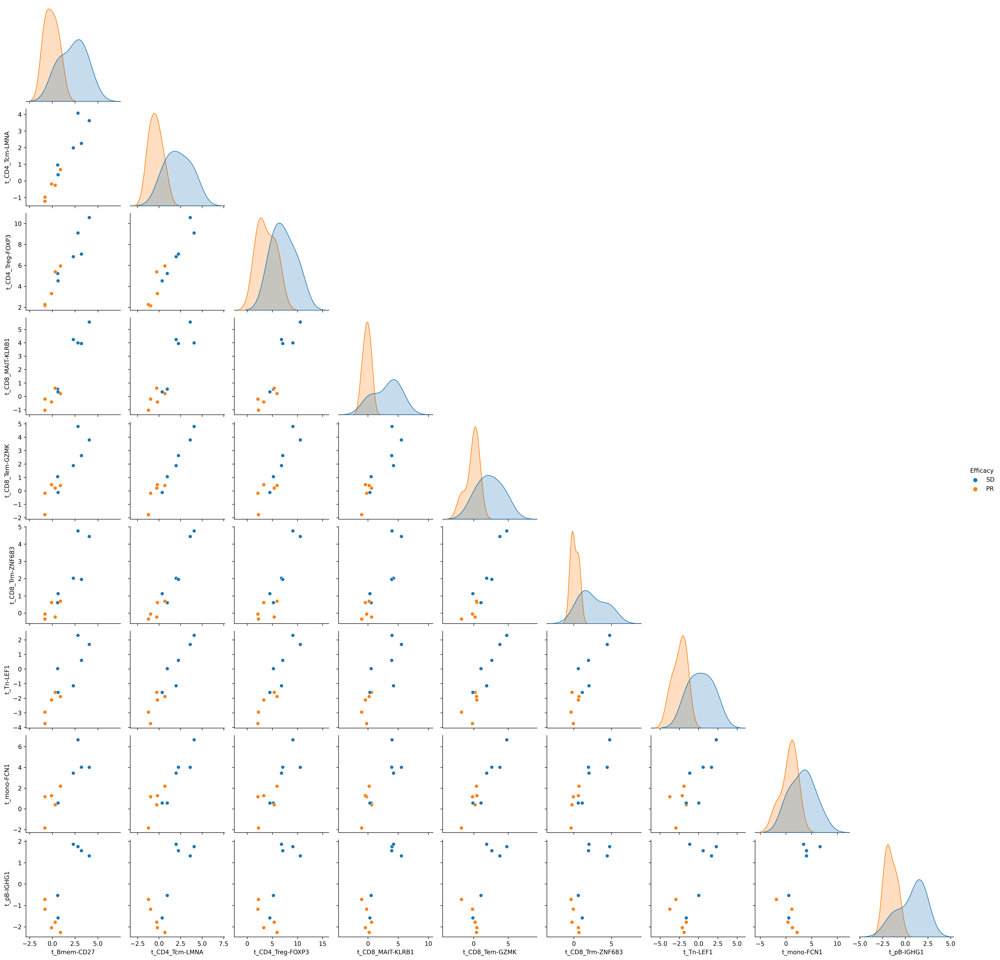

In [458]:
sns.pairplot(mcp4, corner=True, hue="Efficacy")

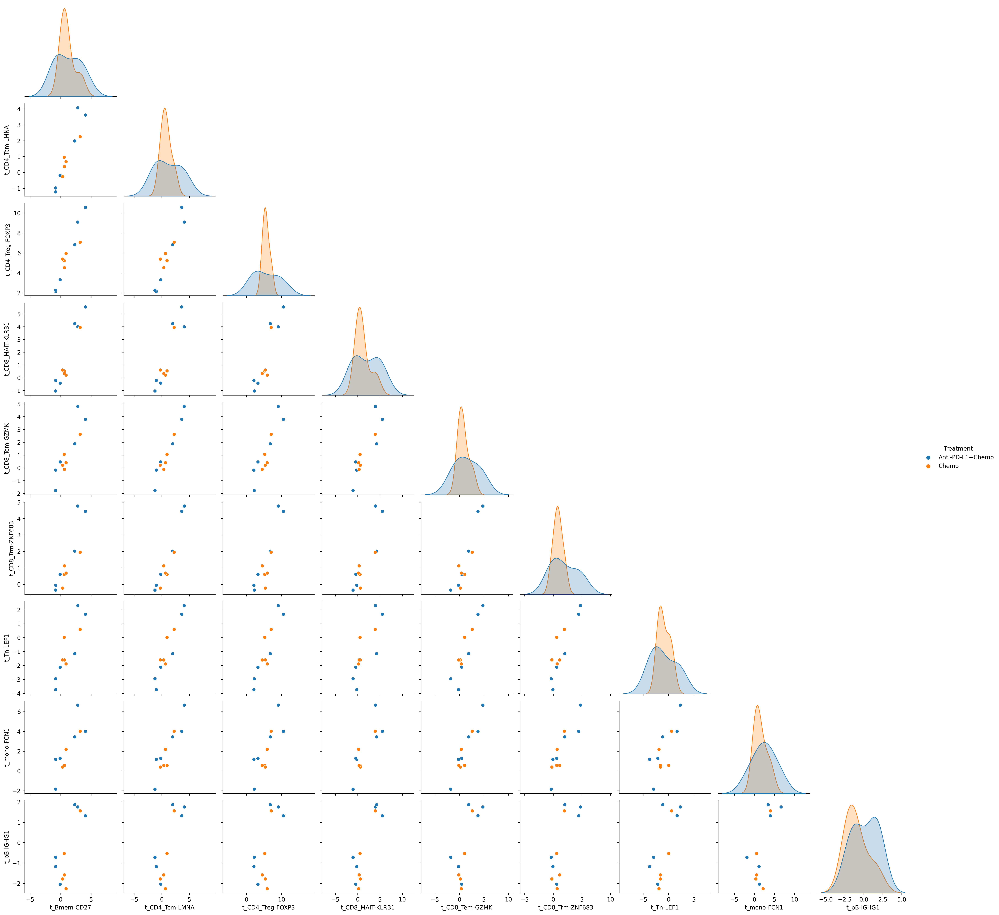

In [459]:
sns.pairplot(mcp4, corner=True, hue="Treatment")

,Sample,Patient,Origin,Tissue,Efficacy,Group,Treatment,Number of counts,Number of genes,Major celltype,...,0,1,2,3,4,5,6,7,8,9
Cell barcode,,,,,,,,,,,,,,,,,,,,,
AAATGCCTCATCTGCC.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,068",513,B cell,...,0.024630,1.731156,-0.744848,-1.153238,-2.364669,-0.565459,0.213890,-2.235570,-1.612739,1.157751
AATCCAGAGCGTTCCG.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,309",545,B cell,...,-0.015568,2.379186,0.599248,-0.514839,-0.284651,-2.689229,1.609176,-2.426111,-0.577653,-0.304269
ACAGCCGAGCACCGCT.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,344",499,B cell,...,-0.587769,8.887239,-7.857848,1.351051,-0.978295,1.568127,7.358125,1.636297,0.596706,2.042717
ACCGTAAAGCTAACTC.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,992,560,B cell,...,-0.932235,1.265569,1.186969,4.360674,1.087998,-3.106793,4.730175,-1.088912,0.503664,-3.890688
ACGAGCCTCGTAGGTT.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,482",715,B cell,...,1.184637,1.318599,-1.971468,-1.286478,-1.083146,-0.509761,-0.303302,-3.145903,-0.818008,2.993912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CGGGTCAGTTCCCGAG.Pre_P004_t,Pre_P004_t,P004,t,chest_wall,SD,Pre-treatment,Anti-PD-L1+Chemo,"1,530",455,B cell,...,0.587343,8.492218,-4.851919,0.032954,8.585988,-4.671846,6.195424,0.022150,13.920639,-0.366522
GCTTGAACAGGCTGAA.Pre_P004_t,Pre_P004_t,P004,t,chest_wall,SD,Pre-treatment,Anti-PD-L1+Chemo,"15,601","1,716",B cell,...,0.142078,3.853591,-3.314564,-1.735825,1.445790,0.577677,-7.093648,-3.069069,9.240065,-1.230335
GTCGGGTGTCCGAATT.Pre_P004_t,Pre_P004_t,P004,t,chest_wall,SD,Pre-treatment,Anti-PD-L1+Chemo,"23,259","1,702",B cell,...,-0.874502,9.149309,-4.820769,1.425461,5.622560,0.482708,-1.389746,-0.723072,11.438540,-3.962799


In [535]:
full_adata = sc.read_h5ad("zhang_with_PCs.h5ad")

In [468]:
ws['t_Bmem-CD27'].shape

(50, 10)

In [471]:
ws['t_CD4_Treg-FOXP3'].shape

(50, 10)

In [481]:
full_adata[full_adata.obs['Cluster']=="t_Bmem-CD27",:].obsm['X_pca'].shape

(12639, 50)

In [486]:
Bmem_all = np.matmul(full_adata[full_adata.obs['Cluster']=="t_Bmem-CD27",:].obsm['X_pca'] ,ws['t_Bmem-CD27'])

In [564]:
def project_mcps(adata, ws, celltype_label = "Cluster",obsm_key = "X_pca", remove_celltypes = True):
    """
    Project the X_pca through ws for all cells
    If cells aren't in the celltype list returns 0
    
    
    """
    adata.obs[list(range(0,10))] =0
    if set(adata.obs[celltype_label].unique().to_list())!= set(ws.keys()):
        print("cell types do not match")
    if remove_celltypes:
        adata=adata[adata.obs['Cluster'].isin(ws.keys())]
    adata.obs
    for celltype in ws.keys():
        print(celltype)
        print(np.matmul(adata[adata.obs[celltype_label]==celltype,:].obsm[obsm_key] ,ws[celltype])
        # issue here is that you're trying to set values for the whole adata
        # but you want to set them for just the cells in this celltype
        adata.obs[list(range(0,10))]=np.matmul(adata[adata.obs[celltype_label]==celltype,:].obsm[obsm_key] ,ws[celltype])
    return(adata)
        

In [568]:
p.obs[list(range(0,10))]=0

In [577]:
adata.obs

,Sample,Patient,Origin,Tissue,Efficacy,Group,Treatment,Number of counts,Number of genes,Major celltype,...,0,1,2,3,4,5,6,7,8,9
Cell barcode,,,,,,,,,,,,,,,,,,,,,
AAATGCCTCATCTGCC.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,068",513,B cell,...,0.024630,1.731156,-0.744848,-1.153238,-2.364669,-0.565459,0.213890,-2.235570,-1.612739,1.157751
AATCCAGAGCGTTCCG.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,309",545,B cell,...,-0.015568,2.379186,0.599248,-0.514839,-0.284651,-2.689229,1.609176,-2.426111,-0.577653,-0.304269
ACAGCCGAGCACCGCT.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,344",499,B cell,...,-0.587769,8.887239,-7.857848,1.351051,-0.978295,1.568127,7.358125,1.636297,0.596706,2.042717
ACCGTAAAGCTAACTC.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,992,560,B cell,...,-0.932235,1.265569,1.186969,4.360674,1.087998,-3.106793,4.730175,-1.088912,0.503664,-3.890688
ACGAGCCTCGTAGGTT.Pre_P007_t,Pre_P007_t,P007,t,lymph_node,PR,Pre-treatment,Anti-PD-L1+Chemo,"1,482",715,B cell,...,1.184637,1.318599,-1.971468,-1.286478,-1.083146,-0.509761,-0.303302,-3.145903,-0.818008,2.993912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CGGGTCAGTTCCCGAG.Pre_P004_t,Pre_P004_t,P004,t,chest_wall,SD,Pre-treatment,Anti-PD-L1+Chemo,"1,530",455,B cell,...,0.587343,8.492218,-4.851919,0.032954,8.585988,-4.671846,6.195424,0.022150,13.920639,-0.366522
GCTTGAACAGGCTGAA.Pre_P004_t,Pre_P004_t,P004,t,chest_wall,SD,Pre-treatment,Anti-PD-L1+Chemo,"15,601","1,716",B cell,...,0.142078,3.853591,-3.314564,-1.735825,1.445790,0.577677,-7.093648,-3.069069,9.240065,-1.230335
GTCGGGTGTCCGAATT.Pre_P004_t,Pre_P004_t,P004,t,chest_wall,SD,Pre-treatment,Anti-PD-L1+Chemo,"23,259","1,702",B cell,...,-0.874502,9.149309,-4.820769,1.425461,5.622560,0.482708,-1.389746,-0.723072,11.438540,-3.962799


In [7]:
### DEBUG

In [9]:
ct_order = cell_types = adata.obs[dl.celltype_key].astype("category").cat.categories

In [10]:
ct_order

Index(['Mix', 'b_Bact-TNFRSF13B', 'b_Bmem-CD27', 'b_Bn-TCL1A',
       'b_CD4_Tcm-TCF7', 'b_CD4_Tem-GZMK', 'b_CD4_Tn-CCR7',
       'b_CD8_Teff-FGFBP2', 'b_CD8_Teff-GNLY', 'b_CD8_Tem-GZMK',
       'b_CD8_Tn-CCR7', 'b_CD14-EGR1', 'b_CD14-FCN1', 'b_CD14-FKBP5',
       'b_CD14-FOLR3', 'b_CD14-IFI6', 'b_CD14-IL1B', 'b_CD14-IPMK',
       'b_CD14-PF4', 'b_CD14-RETN', 'b_CD14-THBS1', 'b_CD16-CDKN1C',
       'b_ILC1-AKR1C3', 'b_ILC1-ATRX', 'b_ILC1-CD160', 'b_ILC1-CXCR4',
       'b_ILC1-HSPA8', 'b_ILC1-KLRC1', 'b_ILC1-KLRC2', 'b_ILC1-KLRC3',
       'b_ILC1-MKI67', 'b_ILC1-S100A9', 'b_ILC1-XCL1', 'b_Tgd-KLRB1',
       'b_Tprf-MKI67', 'b_baso-GATA2', 'b_cDC2-CLEC10A', 'b_mast-TPSAB1',
       'b_pB-IGHG1', 'b_pB-MKI67', 'b_pDC-LILRA4', 't_Bfoc-MKI67',
       't_Bfoc-NEIL1', 't_Bmem-CD27', 't_Bmem-MKI67', 't_Bn-TCL1A',
       't_CD4-CXCL13', 't_CD4_Tact-XIST', 't_CD4_Tcm-LMNA', 't_CD4_Treg-FOXP3',
       't_CD8-CXCL13', 't_CD8_MAIT-KLRB1', 't_CD8_Teff-GNLY', 't_CD8_Tem-GZMK',
       't_CD8_Trm-ZNF683

In [13]:
adata.obs.Cluster

Cell barcode
AAACCTGAGGTTACCT.Pre_P007_b       b_ILC1-HSPA8
AAACCTGCAAAGGAAG.Pre_P007_b     b_CD4_Tem-GZMK
AAACCTGCAAGTCTAC.Pre_P007_b     b_CD4_Tem-GZMK
AAACCTGCAATAAGCA.Pre_P007_b     b_CD4_Tcm-TCF7
AAACCTGCACAGCGTC.Pre_P007_b    b_CD8_Teff-GNLY
                                    ...       
TGGTTAGTCACTCTTA.Pre_P004_t       t_ILC2-SPON2
TGTTCCGTCTAACGGT.Pre_P004_t        t_ILC3-AREG
TTCGAAGCAATCCAAC.Pre_P004_t        t_ILC3-AREG
TTCTCAATCATCATTC.Pre_P004_t        t_ILC3-AREG
TTCTTAGAGAAGCCCA.Pre_P004_t        t_ILC1-IL32
Name: Cluster, Length: 489490, dtype: category
Categories (97, object): ['Mix', 'b_Bact-TNFRSF13B', 'b_Bmem-CD27', 'b_Bn-TCL1A', ..., 't_mono-S100A89', 't_mono-SMIM25', 't_pB-IGHG1', 't_pDC-LILRA4']

In [17]:
adata.obs['Cluster'].cat.remove_unused_categories()


Cell barcode
AAACCTGAGGTTACCT.Pre_P007_b       b_ILC1-HSPA8
AAACCTGCAAAGGAAG.Pre_P007_b     b_CD4_Tem-GZMK
AAACCTGCAAGTCTAC.Pre_P007_b     b_CD4_Tem-GZMK
AAACCTGCAATAAGCA.Pre_P007_b     b_CD4_Tcm-TCF7
AAACCTGCACAGCGTC.Pre_P007_b    b_CD8_Teff-GNLY
                                    ...       
TGGTTAGTCACTCTTA.Pre_P004_t       t_ILC2-SPON2
TGTTCCGTCTAACGGT.Pre_P004_t        t_ILC3-AREG
TTCGAAGCAATCCAAC.Pre_P004_t        t_ILC3-AREG
TTCTCAATCATCATTC.Pre_P004_t        t_ILC3-AREG
TTCTTAGAGAAGCCCA.Pre_P004_t        t_ILC1-IL32
Name: Cluster, Length: 489490, dtype: category
Categories (97, object): ['Mix', 'b_Bact-TNFRSF13B', 'b_Bmem-CD27', 'b_Bn-TCL1A', ..., 't_mono-S100A89', 't_mono-SMIM25', 't_pB-IGHG1', 't_pDC-LILRA4']

In [18]:
adata.obs['Cluster'].unique()

['b_ILC1-HSPA8', 'b_CD4_Tem-GZMK', 'b_CD4_Tcm-TCF7', 'b_CD8_Teff-GNLY', 'b_CD8_Tem-GZMK', ..., 'Mix', 't_macro-CD24', 't_cDC2-CD207', 'b_CD14-IL1B', 't_cDC2-FCGR2B']
Length: 97
Categories (97, object): ['Mix', 'b_Bact-TNFRSF13B', 'b_Bmem-CD27', 'b_Bn-TCL1A', ..., 't_mono-S100A89', 't_mono-SMIM25', 't_pB-IGHG1', 't_pDC-LILRA4']

In [ ]:
    def calculate_multifactor_PMD(  # noqa: N802
        self,
        adata: AnnData,
        penalties: list[int] = None,
        ct_order: list[str] = None,
        agg_pca: bool = True,
        solver: Literal["lp", "bs"] = "bs",
        normalize: bool = True,
    ) -> tuple[AnnData, dict[str, np.ndarray], dict[Any, Any], dict[Any, Any]]:
        """Runs multifactor PMD.
        Currently mimics DIALOGUE1.
        Args:
            adata: AnnData object to calculate PMD for.
            sample_id: Key to use for pseudobulk determination.
            penalties: PMD penalties.
            ct_order: The order of cell types.
            agg_pca: Whether to calculate cell-averaged PCA components.
            solver: Which solver to use for PMD. Must be one of "lp" (linear programming) or "bs" (binary search).
                    For differences between these to please refer to https://github.com/theislab/sparsecca/blob/main/examples/linear_programming_multicca.ipynb
                    Defaults to 'bs'.
            normalize: Whether to mimic DIALOGUE as close as possible
        Returns:
            MCP scores  # TODO this requires more detail
        """
        # IMPORTANT NOTE: the order in which matrices are passed to multicca matters. As such,
        # it is important here that to obtain the same result as in R, we pass the matrices in
        # in the same order.
        if ct_order is not None:
            cell_types = ct_order
        else:
            ct_order = cell_types = adata.obs[self.celltype_key].astype("category").cat.categories

        mcca_in, ct_subs = self.load(adata, ct_order=cell_types, agg_pca=agg_pca, normalize=normalize)

        n_samples = mcca_in[0].shape[1]
        if penalties is None:
            penalties = multicca_permute(
                mcca_in, penalties=np.sqrt(n_samples) / 2, nperms=10, niter=50, standardize=True
            )["bestpenalties"]
        else:
            penalties = penalties

        if solver == "bs":
            ws, _ = multicca_pmd(mcca_in, penalties, K=self.n_mcps, standardize=True, niter=100, mimic_R=normalize)
        elif solver == "lp":
            ws, _ = lp_pmd(mcca_in, penalties, K=self.n_mcps, standardize=True, mimic_R=normalize)
        else:
            raise ValueError('Please select a valid solver. Must be one of "lp" or "bs".')
        ws_dict = {ct: ws[i] for i, ct in enumerate(ct_order)}

        pre_r_scores = {
            ct: ct_subs[ct].obsm["X_pca"][:, :50] @ ws[i] for i, ct in enumerate(cell_types)  # TODO change from 50
        }

        # TODO: output format needs some cleanup, even though each MCP score is matched to one cell, it's not at all
        # matched at this point in the function and requires references to internals that shouldn't need exposing (ct_subs)

        mcp_scores = {
            ct: self._get_residuals(ct_subs[ct].obs[self.n_counts_key].values, pre_r_scores[ct].T).T
            for i, ct in enumerate(cell_types)
        }

        adata = self._concat_adata_mcp_scores(
            adata, ct_subs=ct_subs, mcp_scores=mcp_scores, celltype_key=self.celltype_key
        )

        return adata, mcp_scores, ws_dict, ct_subs

In [55]:
ct_order = cell_types = adata.obs[dl.celltype_key].astype("category").cat.categories


In [56]:
ct_order

Index(['t_Bmem-CD27', 't_CD4_Tcm-LMNA', 't_CD4_Treg-FOXP3', 't_CD8_MAIT-KLRB1',
       't_CD8_Tem-GZMK', 't_CD8_Trm-ZNF683', 't_Tn-LEF1', 't_mono-FCN1',
       't_pB-IGHG1'],
      dtype='object')

In [57]:
mcca_in, ct_subs = dl.load(adata, ct_order=cell_types, agg_pca=True, normalize=False)

In [68]:
dl.sample_id

'Sample'

In [61]:
n_samples = mcca_in[0].shape[1]

In [71]:
n_samples

50

In [70]:
adata.obs['Sample'].unique()

['Pre_P007_t', 'Pre_P012_t', 'Pre_P023_t', 'Pre_P018_t', 'Pre_P016_t', ..., 'Pre_P022_t', 'Pre_P019_t', 'Pre_P020_t', 'Pre_P005_t', 'Pre_P004_t']
Length: 11
Categories (11, object): ['Pre_P004_t', 'Pre_P005_t', 'Pre_P007_t', 'Pre_P012_t', ..., 'Pre_P020_t', 'Pre_P022_t', 'Pre_P023_t', 'Pre_P025_t']

In [74]:
adata.obs['Cluster'].unique()

['t_Tn-LEF1', 't_CD8_Tem-GZMK', 't_CD8_MAIT-KLRB1', 't_Bmem-CD27', 't_CD4_Treg-FOXP3', 't_CD8_Trm-ZNF683', 't_CD4_Tcm-LMNA', 't_pB-IGHG1', 't_mono-FCN1']
Categories (9, object): ['t_Bmem-CD27', 't_CD4_Tcm-LMNA', 't_CD4_Treg-FOXP3', 't_CD8_MAIT-KLRB1', ..., 't_CD8_Trm-ZNF683', 't_Tn-LEF1', 't_mono-FCN1', 't_pB-IGHG1']

In [207]:
celltypes

['t_Bmem-CD27',
 't_CD4_Tcm-LMNA',
 't_CD4_Treg-FOXP3',
 't_CD8_MAIT-KLRB1',
 't_CD8_Tem-GZMK',
 't_CD8_Trm-ZNF683',
 't_Tn-LEF1',
 't_mono-FCN1',
 't_pB-IGHG1']

In [267]:
adata.X

array([[-2.0700525e-01, -6.2246257e-01, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       [-2.0700525e-01, -6.2246257e-01, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       [-2.0700525e-01,  1.8512141e+00, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       ...,
       [-2.0700525e-01,  1.6396410e+00, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       [ 5.4895082e+00,  9.3729299e-01, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       [-2.0700525e-01, -6.2246257e-01, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03]], dtype=float32)

In [268]:
 np.array(adata.X)

array([[-2.0700525e-01, -6.2246257e-01, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       [-2.0700525e-01, -6.2246257e-01, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       [-2.0700525e-01,  1.8512141e+00, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       ...,
       [-2.0700525e-01,  1.6396410e+00, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       [ 5.4895082e+00,  9.3729299e-01, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03],
       [-2.0700525e-01, -6.2246257e-01, -2.3194550e-01, ...,
        -3.8712469e-03, -4.2332811e-03, -4.3574884e-03]], dtype=float32)

In [299]:
all_results_2, new_mcps_2 = dl_2.multilevel_modeling(ct_subs=ct_subs_2,
                                     mcp_scores=mcps_2,
                                     ws_dict=ws_2,
                                     confounder=None,
                                   )

Output()

10 MCPs identified for t_Bmem-CD27 and t_CD4_Tcm-LMNA.

AttributeError: 'numpy.ndarray' object has no attribute 'toarray'

In [ ]:
ct_subs['TA2'].obs['nCount_RNA']

In [1]:
ct_subs_2

NameError: name 'ct_subs_2' is not defined

In [301]:
new_mcps_2

NameError: name 'new_mcps_2' is not defined

In [4]:
dl_2

NameError: name 'dl_2' is not defined